# NODOSPLAZA

**Objetivos:**
1. Mapa de calor: temperatura y personas    
2. Monitoreo de mascotas y personas     
3. Monitoreo de uso y estado del mobiliario 
Modelo principal: **YOLOv8s**   
Identifica personas, gatos, perros, sillas y bancas.    

Modelos complementarios:    
**BDRAR**: para generar máscara de sombra, preentrenado, sin finetuning.       
**OpenCV:** detección de cambio en mobiliario con bboxes manuales       
**pythermalcomfort:**  cálculo de UTCI      
**KMeans:** mapa de islas de calor percibido            

Hay **métricas** que se miden por snapshot (1 foto+data sensor de ese momento), y otras que se miden por batch (después de procesar varios snapshots):

Por snapshot:           
**Crowd density** (n° personas actual)      
**Conteo mascotas** actual      
**Shade utilization** (%actual de personas en sombra)       
**Uso mobiliario** (sí/no para cada uno)        
**UTCI** (cálculo con datos de los sensores)        

Por batch:      
**ocupación sostenida** (tiempo estadía calculado desde el n° personas antes vs n° personas ahora)     
**Activity classification** (reposo/circulación para mascotas y personas, se compara bbox entre snapshots)      
**Uso mobiliario** (demanda baja/media/alta, contar interacciones)      
**Shade utilization histórico** (promedio x hora x zona)        
**Correlaciones** (UV vs sombra, UTCI vs dwell; x día o por semana)     
**KMeans** (mapa de islas de calor)         


Pipeline tareas de este nb:
- fase 0.5: insertar imagenes de cámara
- fase 1: yolo detectar personas perros y mobiliario y contar la densidad de personas y mascotas
- fase 2: bdrar (sombra) y cruzar con bboxes personas
- fase 3: conteo uso mobiliario
- fase 3.5: ordenar data obtenida e insertar datos sensores
- fase 4: pythermalcomfort para calcular utci
- fase 5: amononar datos (inferencias de las detecciones)
- fase 5.5: guardarlos en bd
- fase 6: cada x cantidad de imágenes, consultar la bd y extraer datos para obetner las métricas por batch, y gardar en bd
- fase 7: kmeans mapa de islas de calor


In [126]:
# %pip install ultralytics opencv-python numpy matplotlib pythermalcomfort scikit-learn torch torchvision scipy requests pillow pandas seaborn

#### FASE 0.5: insertar imágenes de cámara

P1: imports y configuración global  
-imports    
-constantes (tamaño img, tamaño zonas)  
-clases yolo de interés     
-treshold confianza para yolo   
-colores del heatmap    

P2: definiciones funciones de carga de img  
-cargar_img_local(path) 
-cargar_img_url(url)    
-capturar_frame_youtube(url)    
-mostrar_imagen(imagen_bgr, nombre_fuente)  

P3: selección de fuente y carga     
-diccionario fuentes de videos youtube      
-variable fuente_activa         
-ejecuta el capturar un frame y la muestra          

In [127]:
#imports y config
# [CAMBIAR A FUTURO]: ajustar cuando esté instalada la cam
# (!!!): revisar
# [AJUSTABLE]: modificar para mejorar el funcionamiento

In [128]:
import sys
import os
import subprocess
import random
import json
import datetime
import csv
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
from scipy.ndimage import gaussian_filter
from scipy.spatial.distance import cdist
from PIL import Image
from io import BytesIO
import requests
import torch
import torch.nn as nn
from torchvision import transforms
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from pythermalcomfort.models import utci
from ultralytics import YOLO
import warnings
import glob
warnings.filterwarnings('ignore')

In [129]:
# Imagen: debe coincidir con lo que manda la RPi (!!!)
ANCHO = 1280
ALTO  = 720

# YOLO
CLASES_INTERES = {
    0:  'persona',
    13: 'banca',
    15: 'gato',
    16: 'perro',
    56: 'silla',
    # (!!!) agregar clases custom después del fine-tuning con datos del canil: rampa, túnel, piscina, bebedero, dispensador de bolsas
}
UMBRAL_CONFIANZA = 0.20 # [AJUSTABLE] umbral de confianza YOLO

# Colores visualización (BGR)
COLOR_PERSONA            = (0, 255, 0)    # verde
COLOR_MASCOTA            = (0, 165, 255)  # naranja
COLOR_MOBILIARIO_LIBRE   = (255, 200, 0)  # azul claro
COLOR_MOBILIARIO_OCUPADO = (0, 0, 255)    # rojo

# Parque 
AREA_PARQUE_M2 = 3000 # [CAMBIAR A FUTURO] valor inventado por el momento, verificar cuando esté instalada la cam

print(f'   Resolución: {ANCHO}×{ALTO}')
print(f'   Clases de interés: {list(CLASES_INTERES.values())}')
print(f'   Umbral confianza YOLO: {UMBRAL_CONFIANZA}')

   Resolución: 1280×720
   Clases de interés: ['persona', 'banca', 'gato', 'perro', 'silla']
   Umbral confianza YOLO: 0.2


In [130]:
#definiciones funciones de carga de imgs

In [131]:
def cargar_imagen_local(ruta):
    """Carga una imagen desde disco y la redimensiona."""
    img = cv2.imread(ruta)
    if img is None:
        raise FileNotFoundError(f'No se encontró imagen en: {ruta}')
    return cv2.resize(img, (ANCHO, ALTO))


def mostrar_imagen(img_bgr, titulo='Imagen'):
    """Muestra una imagen BGR en el notebook."""
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(14, 8))
    plt.imshow(img_rgb)
    plt.title(titulo, fontsize=13)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


In [132]:
#selección de fuente y carga

✅ 8640 frames disponibles en frames_cinquez/


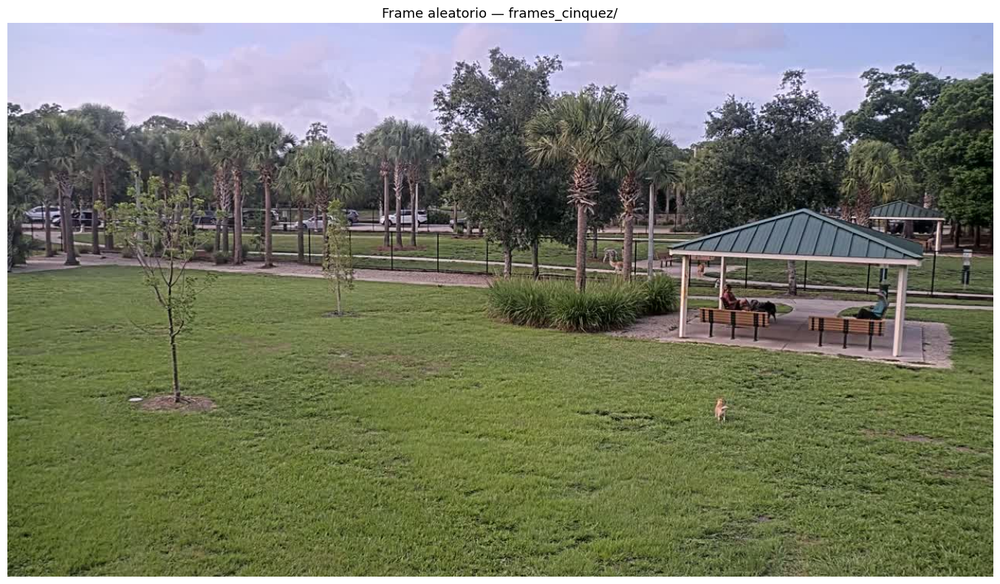

In [133]:
# [AJUSTABLE] opciones: 'frames_schuylkill/', 'frames_cinquez/' 
#schuylkill es un video de unos 20 min de un parqucito con hartas personas y perros.
#cinquez es parte de un livestream que capturé por 12h de un parque mucho más amplio y mucho menos afluencia
CARPETA_FRAMES = 'frames_cinquez/'

frames_disponibles = sorted(glob.glob(f'{CARPETA_FRAMES}*.jpg'))
print(f'✅ {len(frames_disponibles)} frames disponibles en {CARPETA_FRAMES}')

# [CAMBIAR A FUTURO] en producción img_original viene del HTTP POST de la RPi
img_original = cargar_imagen_local(random.choice(frames_disponibles))
mostrar_imagen(img_original, f'Frame aleatorio — {CARPETA_FRAMES}')

#### FASE 1: YOLO

P1: cargar modelo       
-yolo_model= YOLO('yolov8s.pt') 

P2: definir función correr modelo       
-recibe img, modelo y treshold confianza        
-parámetros modelo iou:0.5, agnostic_nms=True, imgsz:1280       
-por detección guarda: clase, confianza, bbox coorddenadas vérticas y centro        
-separa en personas[], mascotas[], mobiliario[]     
-retorna dict {personas, mascotas, mobiliario}      

P3: correr yolo     
-llama a correr_yolo(img,modelo)        
-imprime conteos por categoría      
-retorna detcciones dict        

P4: visualizar detecciones                  
-dibujar las bboxes con color x categoría       
-generar heatmap de densidad de personas/mascotas (canvas vacío del mismo tamaño q img y por cada persona agrega punto gaussiano en el centro de su bbox y aplica gaussian_filter(sigma=40) para suavizar, superponer sobre img con colormap de azul a rojo.)   
-muestra img con bboxes y heatmap       

In [134]:
#cargar modelo

In [135]:
modelo_yolo = YOLO('yolov8s.pt')
print('Modelo YOLO cargado')

Modelo YOLO cargado


In [136]:
#funcion correr modelo

In [137]:
def correr_yolo(img_bgr, modelo, umbral=UMBRAL_CONFIANZA):
    result = modelo(
        img_bgr,
        conf         = umbral,
        iou          = 0.5,    # [AJUSTABLE] bajar si hay detecciones duplicadas
        imgsz        = 1280,   # [AJUSTABLE] bajar a 640 si el servidor es lento
        agnostic_nms = True,
        verbose      = False
    )[0]

    personas, mascotas, mobiliario = [], [], []

    for caja in result.boxes:
        clase_id = int(caja.cls)
        if clase_id not in CLASES_INTERES:
            continue
        x1, y1, x2, y2 = map(int, caja.xyxy[0].tolist())
        deteccion = {
            'clase':     CLASES_INTERES[clase_id],
            'confianza': round(float(caja.conf), 3),
            'bbox':      (x1, y1, x2, y2),
            'centro':    ((x1+x2)//2, (y1+y2)//2),
        }
        if clase_id == 0:             personas.append(deteccion)
        elif clase_id in [15, 16]:    mascotas.append(deteccion)
        elif clase_id in [13, 56]:    mobiliario.append(deteccion)

    return {'personas': personas, 'mascotas': mascotas, 'mobiliario': mobiliario}


def generar_canvas(detecciones, categorias, alto, ancho):
    """Canvas gaussiano de densidad — se reutiliza en Fase 5."""
    canvas = np.zeros((alto, ancho), dtype=np.float32)
    for cat in categorias:
        for det in detecciones[cat]:
            cx, cy = det['centro']
            if 0 <= cx < ancho and 0 <= cy < alto:
                canvas[cy, cx] += 1.0
    canvas = gaussian_filter(canvas, sigma=40)  # [AJUSTABLE] suavizado
    if canvas.max() > 0:
        canvas /= canvas.max()
    return canvas

In [138]:
#correr modelo

In [139]:
detecciones = correr_yolo(img_original, modelo_yolo)
print(f'personas:   {len(detecciones["personas"])}')
print(f'mascotas:   {len(detecciones["mascotas"])}')
print(f'mobiliario: {len(detecciones["mobiliario"])}')

personas:   4
mascotas:   1
mobiliario: 2


In [140]:
#visualizar detecciones

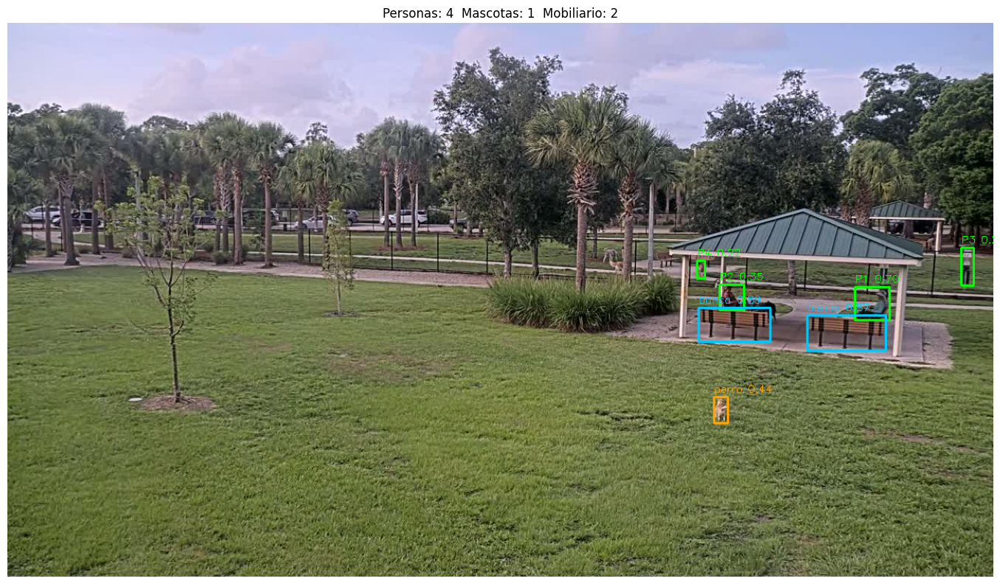

In [141]:
def visualizar_bboxes(img_bgr, detecciones):
    img_bboxes = img_bgr.copy()
    colores_categoria = {
        'personas':   COLOR_PERSONA,
        'mascotas':   COLOR_MASCOTA,
        'mobiliario': COLOR_MOBILIARIO_LIBRE,
    }
    for categoria, color in colores_categoria.items():
        for i, det in enumerate(detecciones[categoria]):
            x1, y1, x2, y2 = det['bbox']
            cv2.rectangle(img_bboxes, (x1, y1), (x2, y2), color, 2)
            label = f"P{i+1} {det['confianza']:.2f}" if categoria == 'personas' \
                    else f"{det['clase']} {det['confianza']:.2f}"
            cv2.putText(img_bboxes, label, (x1, y1-6),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 1)

    plt.figure(figsize=(14, 8))
    plt.imshow(cv2.cvtColor(img_bboxes, cv2.COLOR_BGR2RGB))
    plt.title(
        f'Personas: {len(detecciones["personas"])}  '
        f'Mascotas: {len(detecciones["mascotas"])}  '
        f'Mobiliario: {len(detecciones["mobiliario"])}', fontsize=12)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

visualizar_bboxes(img_original, detecciones)

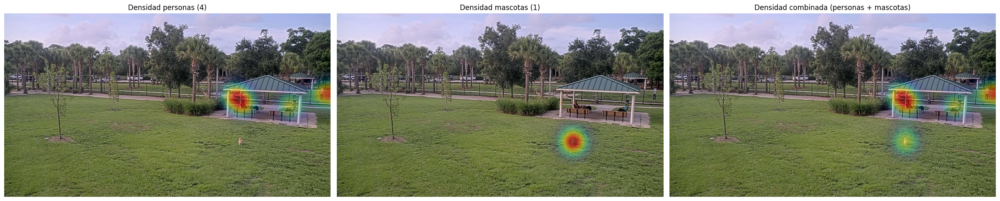

In [142]:
def generar_canvas(detecciones, categorias, alto, ancho):
    """Genera canvas gaussiano para las categorías indicadas."""
    canvas = np.zeros((alto, ancho), dtype=np.float32)
    for cat in categorias:
        for det in detecciones[cat]:
            cx, cy = det['centro']
            if 0 <= cx < ancho and 0 <= cy < alto:
                canvas[cy, cx] += 1.0
    canvas = gaussian_filter(canvas, sigma=40)  # [AJUSTABLE] suavizado
    if canvas.max() > 0:
        canvas /= canvas.max()
    return canvas

def superponer_heatmap(img_bgr, canvas):
    img_rgb    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    mask       = canvas[:, :, np.newaxis]
    resultado  = img_rgb * (1 - mask * 0.6) + plt.cm.jet(canvas)[:,:,:3] * (mask * 0.6)  # [AJUSTABLE] 0.6: opacidad
    return np.clip(resultado, 0, 1)

alto, ancho = img_original.shape[:2]

canvas_personas  = generar_canvas(detecciones, ['personas'],           alto, ancho)
canvas_mascotas  = generar_canvas(detecciones, ['mascotas'],           alto, ancho)
canvas_combinado = generar_canvas(detecciones, ['personas','mascotas'], alto, ancho)

fig, ejes = plt.subplots(1, 3, figsize=(24, 7))

ejes[0].imshow(superponer_heatmap(img_original, canvas_personas))
ejes[0].set_title(f'Densidad personas ({len(detecciones["personas"])})', fontsize=12)
ejes[0].axis('off')

ejes[1].imshow(superponer_heatmap(img_original, canvas_mascotas))
ejes[1].set_title(f'Densidad mascotas ({len(detecciones["mascotas"])})', fontsize=12)
ejes[1].axis('off')

ejes[2].imshow(superponer_heatmap(img_original, canvas_combinado))
ejes[2].set_title(f'Densidad combinada (personas + mascotas)', fontsize=12)
ejes[2].axis('off')

plt.tight_layout()
plt.show()

# guardar canvas combinado para reutilizar en Fase 5
canvas_heatmap = canvas_combinado

#### FASE 2: BDRAR

P1: Setup           
-agregar Shadow-Detection-and-Removal/ al sys.path (repo de BDRAR parcheado para PyTorch moderno)       
-importar clase BDRAR desde el repo clonado     
-cargar pesos desde ckpt/BDRAR/3000.pth      
-poner modelo en eval mode      
-verificar que cargó correctamente      
-output: bdrar_model listo para usar        

*added: detector de nubosidad, checkea antes de procesar máscara

P2: función detectar_sombra     
-recibe img, convierte a rgb, resize        
-inferencia torch.no_grad()     
-post: pasar a numpy, normalizar [0,1], resize, umbralizar en 0.5 (máscara binaria)         
-retorna mascara_sombra shape (720,1280) 0:sol 1:sombra     

P3: función persona_en_sombra              
-recibe bbox persona y mascara_sombra           
-extrae región de máscara que correspondan al bbox      
-pct_sombra: mean de esa región (cantidad de sombra en la bbox, 0.0: todo sol, 1.0: todo sombra)        
-en_sombra = true si pct_sombra > 0.5           
-retorna (en_sombra: bool, pct_sombra)      


P4: ejecutar bdrar y visualizar     
-llama a detectar_sombra (img, bdrar)       
-para cada persona en detecciones: llama a persona_en_sombra y agrega en_sombra y pct_sombra a su dict      
-calcula shade_utilization_actual (personas en sombra/total)        
-visualización img original con bboxes superpuesta con la máscara de sombra (agregar indicador si se considera en sombra o no por bbox), + shade utilization %      

In [143]:
# setup BDRAR : clonar repo y descargar pesos
# ATENCIÓN: pesos BDRAR (3000.pth) requieren descarga manual:
#   1. https://github.com/zijundeng/BDRAR ->  README -> "pretrained model" -> Google Drive
#   2. Descargar 3000.pth
#   3. Copiar a: Shadow-Detection-and-Removal/ckpt/BDRAR/3000.pth

# clonar repo
if not os.path.exists('./Shadow-Detection-and-Removal'):
    subprocess.run(['git', 'clone',
                    'https://github.com/RolandGao/Shadow-Detection-and-Removal'],
                   check=True)

RUTA_BDRAR = os.path.abspath('./Shadow-Detection-and-Removal')

# descargar backbone ResNeXt101
ruta_resnext = os.path.join(RUTA_BDRAR, 'resnext', 'resnext_101_32x4d.pth')
if not os.path.exists(ruta_resnext):
    import gdown
    gdown.download(
        'https://drive.google.com/uc?id=1dnH-IHwmu9xFPlyndqI6MfF4LvH6JKNQ',
        ruta_resnext, quiet=False
    )

# parchar config.py con ruta absoluta del backbone
# necesario porque el repo tiene el path hardcodeado como ruta relativa
ruta_config = os.path.join(RUTA_BDRAR, 'resnext', 'config.py')
with open(ruta_config, 'w') as f:
    f.write(f"resnext_101_32_path = r'{ruta_resnext}'\n")
print(f'✅ config.py parcheado: {ruta_resnext}')

# verificar pesos BDRAR
ruta_bdrar_pesos = os.path.join(RUTA_BDRAR, 'ckpt', 'BDRAR', '3000.pth')
os.makedirs(os.path.dirname(ruta_bdrar_pesos), exist_ok=True)
if not os.path.exists(ruta_bdrar_pesos):
    print('⚠️  Pesos BDRAR no encontrados — descarga manual requerida')
    print(f'   → Copiar 3000.pth a: {ruta_bdrar_pesos}')

✅ config.py parcheado: c:\Users\ACER\Desktop\u\nodosplaza\Shadow-Detection-and-Removal\resnext\resnext_101_32x4d.pth


In [144]:
# cargar modelo BDRAR
# se carga por ruta absoluta
import importlib.util
spec = importlib.util.spec_from_file_location('model', os.path.join(RUTA_BDRAR, 'model.py'))
modulo_model = importlib.util.module_from_spec(spec)
if RUTA_BDRAR not in sys.path:
    sys.path.insert(0, RUTA_BDRAR)
spec.loader.exec_module(modulo_model)

modelo_bdrar = modulo_model.BDRAR()
modelo_bdrar.load_state_dict(
    torch.load(ruta_bdrar_pesos, map_location='cpu')
)
modelo_bdrar.eval()
print(f'✅ BDRAR cargado. pesos: {ruta_bdrar_pesos}')

✅ BDRAR cargado. pesos: c:\Users\ACER\Desktop\u\nodosplaza\Shadow-Detection-and-Removal\ckpt\BDRAR\3000.pth


In [145]:
transformacion_bdrar = transforms.Compose([
    transforms.Resize((416, 416)),  # [AJUSTABLE] bajar a 256 si es lento
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def detectar_sombra(img_bgr, modelo, sat):
    alto, ancho = img_bgr.shape[:2]
    x = transformacion_bdrar(Image.fromarray(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))).unsqueeze(0)
    with torch.no_grad():
        pred = modelo(x).squeeze().cpu().numpy()
    pred = (pred - pred.min()) / (pred.max() - pred.min() + 1e-8)
    pred = cv2.resize(pred, (ancho, alto))
    umbral = float(np.clip(0.00 + (sat / 4000), 0.00, 0.60))  # [AJUSTABLE]
    return (pred > umbral).astype(np.uint8)

In [146]:
def persona_en_sombra(bbox, mascara):
    x1, y1, x2, y2 = bbox
    region = mascara[y1:y2, x1:x2]
    if region.size == 0: return False, 0.0
    pct = float(np.mean(region))
    return pct > 0.20, round(pct, 3)  # [AJUSTABLE]

def es_de_noche(img_bgr, umbral_brillo=110):  # [AJUSTABLE]
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    return float(hsv[:,:,2].mean()) < umbral_brillo

def es_nublado(img_bgr, umbral_sat=75):  # [AJUSTABLE]
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    return float(hsv[:,:,1].mean()) < umbral_sat

In [147]:
# ejecutar BDRAR y cruzar con personas
hsv_orig      = cv2.cvtColor(img_original, cv2.COLOR_BGR2HSV)
sat_orig      = round(float(hsv_orig[:,:,1].mean()), 2)
brillo_orig   = round(float(hsv_orig[:,:,2].mean()), 2)
noche         = es_de_noche(img_original)
nublado       = es_nublado(img_original)
shade_utilization_pct = None

if noche or nublado:
    mascara_sombra = np.zeros((ALTO, ANCHO), dtype=np.uint8)
    estado = '🌙 noche' if noche else '☁️ nublado'
    print(f'{estado} (sat={sat_orig}, brillo={brillo_orig}) — BDRAR omitido')
else:
    mascara_sombra = detectar_sombra(img_original, modelo_bdrar, sat_orig)
    for d in detecciones['personas'] + detecciones['mascotas']:
        d['en_sombra'], d['pct_sombra'] = persona_en_sombra(d['bbox'], mascara_sombra)
    todos = detecciones['personas'] + detecciones['mascotas']
    n_s   = sum(1 for d in todos if d['en_sombra'])
    shade_utilization_pct = round(n_s / len(todos), 3) if todos else 0.0
    print(f'☀️ soleado (sat={sat_orig}, brillo={brillo_orig}) — shade: {shade_utilization_pct*100:.1f}%')


☀️ soleado (sat=78.2, brillo=123.34) — shade: 20.0%


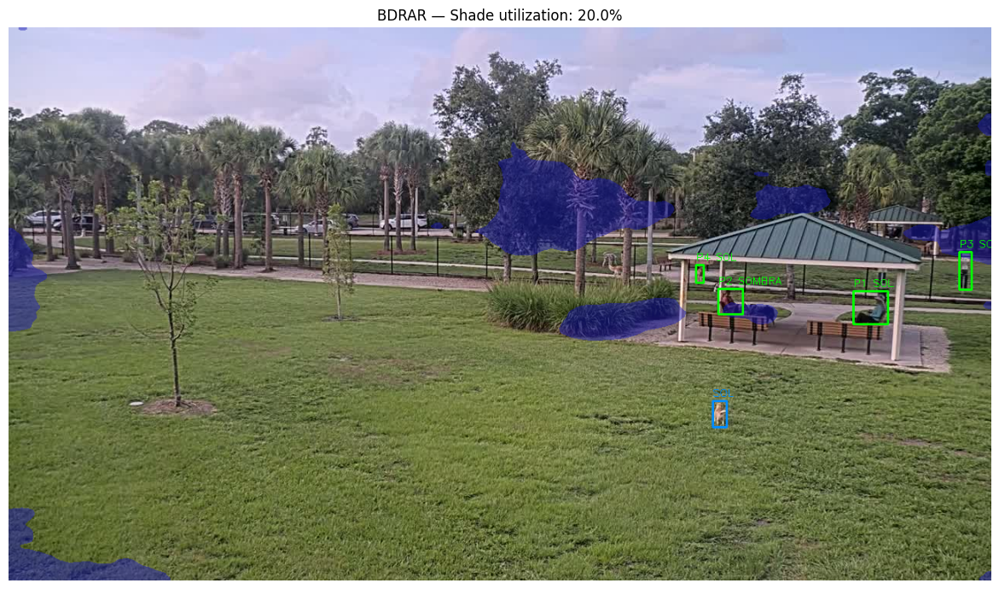

In [148]:
#visualización
overlay = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB).astype(np.float32)
if not noche and not nublado:
    overlay[mascara_sombra==1] = overlay[mascara_sombra==1]*0.5 + np.array([30,30,180])*0.5  # [AJUSTABLE] opacidad
overlay = np.clip(overlay, 0, 255).astype(np.uint8)

for i, p in enumerate(detecciones['personas']):
    x1,y1,x2,y2 = p['bbox']
    cv2.rectangle(overlay,(x1,y1),(x2,y2),COLOR_PERSONA,2)
    cv2.putText(overlay,f'P{i+1} {"SOMBRA" if p.get("en_sombra") else "SOL"}',(x1,y1-6),cv2.FONT_HERSHEY_SIMPLEX,0.45,COLOR_PERSONA,1)
for m in detecciones['mascotas']:
    x1,y1,x2,y2 = m['bbox']
    color = (200,80,255) if m.get('en_sombra') else (0,140,255)
    cv2.rectangle(overlay,(x1,y1),(x2,y2),color,2)
    cv2.putText(overlay,f'{"SOMBRA" if m.get("en_sombra") else "SOL"}',(x1,y1-6),cv2.FONT_HERSHEY_SIMPLEX,0.45,color,1)

shade_str = f'{shade_utilization_pct*100:.1f}%' if shade_utilization_pct is not None else 'N/A'
plt.figure(figsize=(14,7))
plt.imshow(overlay)
plt.title(f'BDRAR — Shade utilization: {shade_str}', fontsize=12)
plt.axis('off')
plt.tight_layout()
plt.show()

#### FASE 3: uso mobiliario

P1: definir bboxes manuales del mobiliario          
-diccionario mobiliario_bboxes con sus coordenadas vertices             
-visualizar las bboxes definidas a mano sobre la img para confirmar q esté bn        

P2: inferir_uso_snapshot        
-recibe las detecciones de personas y mascotas y el diccionario de muebles,    cuenta cuántas personas y/o perros tienen bbox que intersecten con el mueble.    
-retorna dict nombre_mueble:{ocupado:bool, n_usuarios:int, n_personas:int, n_mascotas:int}  

P3: ejecutar y ver  
-bboxes mobiliario verde:libre, rojo:ocupado, nombre_mueble + n_usuarios encimita, también imprimr en tabla mueble/ocupado/n_personas/n_mascotas    
-output uso_mobiliario_snapshot dict    


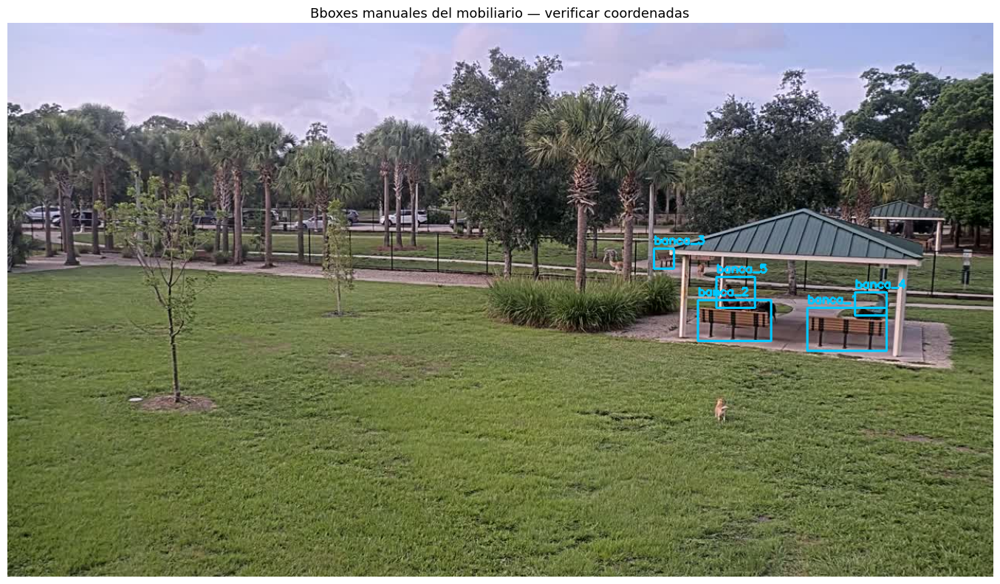

In [149]:
# bboxes manuales del mobiliario
# [CAMBIAR A FUTURO] coordenadas se definen el día de instalación de la cámara
# coordenadas obtenidas de detecciones YOLO + bbox manual del techo
# coordenadas (x1, y1, x2, y2) en píxeles sobre imagen 1280×720
MOBILIARIO_BBOXES = {
    'banca_1': (1038, 370, 1141, 426),
    'banca_2': (896, 360, 991, 413),
    'banca_3': (839, 293, 865, 319),
    'banca_4': (1100, 350, 1141, 380),
    'banca_5': (920, 330, 970, 370)
}

# visualizar para confirmar coordenadas
def mostrar_bboxes_mobiliario(img_bgr, mobiliario_bboxes):
    img = img_bgr.copy()
    for nombre, (x1, y1, x2, y2) in mobiliario_bboxes.items():
        cv2.rectangle(img, (x1, y1), (x2, y2), COLOR_MOBILIARIO_LIBRE, 2)
        cv2.putText(img, nombre, (x1, y1-6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, COLOR_MOBILIARIO_LIBRE, 2)
    mostrar_imagen(img, 'Bboxes manuales del mobiliario — verificar coordenadas')

mostrar_bboxes_mobiliario(img_original, MOBILIARIO_BBOXES)

In [150]:
# función inferir uso mobiliario por snapshot
def inferir_uso_snapshot(detecciones, mobiliario_bboxes):
    """
    Cuenta personas y mascotas cuya bbox intersecta con cada mueble.
    Retorna {nombre: {ocupado, n_usuarios, n_personas, n_mascotas}}
    """
    def area_interseccion(a, b):
        return max(0, min(a[2],b[2]) - max(a[0],b[0])) * \
               max(0, min(a[3],b[3]) - max(a[1],b[1]))

    resultado = {}
    for nombre, bbox_m in mobiliario_bboxes.items():
        area_m     = (bbox_m[2]-bbox_m[0]) * (bbox_m[3]-bbox_m[1])
        n_personas = sum(1 for p in detecciones['personas']
                         if area_m > 0 and area_interseccion(p['bbox'], bbox_m) / area_m > 0.2)  # [AJUSTABLE]
        n_mascotas = sum(1 for m in detecciones['mascotas']
                         if area_m > 0 and area_interseccion(m['bbox'], bbox_m) / area_m > 0.2)  # [AJUSTABLE]
        n_usuarios = n_personas + n_mascotas
        resultado[nombre] = {
            'ocupado':    n_usuarios > 0,
            'n_usuarios': n_usuarios,
            'n_personas': n_personas,
            'n_mascotas': n_mascotas,
        }
    return resultado

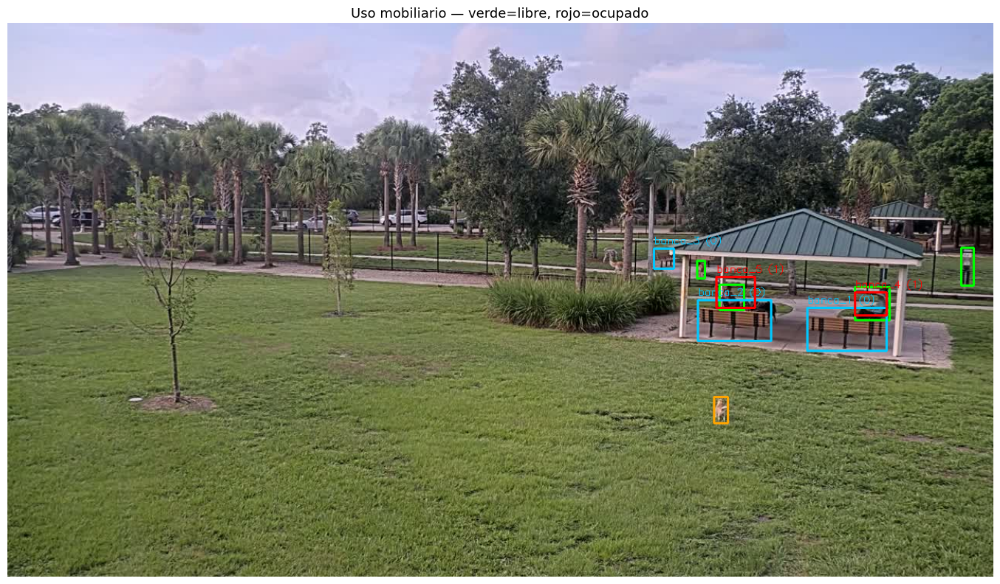


  Mueble          Ocupado    Personas   Mascotas
  ---------------------------------------------
  banca_1         no         0          0
  banca_2         no         0          0
  banca_3         no         0          0
  banca_4         sí         1          0
  banca_5         sí         1          0


In [151]:
# ejecutar y visualizar uso mobiliario
uso_mobiliario_snapshot = inferir_uso_snapshot(detecciones, MOBILIARIO_BBOXES)

img_uso = img_original.copy()

# bboxes personas y mascotas
for p in detecciones['personas']:
    x1, y1, x2, y2 = p['bbox']
    cv2.rectangle(img_uso, (x1, y1), (x2, y2), COLOR_PERSONA, 2)
for m in detecciones['mascotas']:
    x1, y1, x2, y2 = m['bbox']
    cv2.rectangle(img_uso, (x1, y1), (x2, y2), COLOR_MASCOTA, 2)

# bboxes mobiliario
for nombre, (x1, y1, x2, y2) in MOBILIARIO_BBOXES.items():
    estado = uso_mobiliario_snapshot[nombre]
    color  = COLOR_MOBILIARIO_OCUPADO if estado['ocupado'] else COLOR_MOBILIARIO_LIBRE
    cv2.rectangle(img_uso, (x1, y1), (x2, y2), color, 2)
    cv2.putText(img_uso, f"{nombre} ({estado['n_usuarios']})", (x1, y1-6),
                cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 1)

mostrar_imagen(img_uso, 'Uso mobiliario — verde=libre, rojo=ocupado')

print(f'\n  {"Mueble":<15} {"Ocupado":<10} {"Personas":<10} {"Mascotas"}')
print('  ' + '-'*45)
for nombre, e in uso_mobiliario_snapshot.items():
    print(f'  {nombre:<15} {"sí" if e["ocupado"] else "no":<10} {e["n_personas"]:<10} {e["n_mascotas"]}')

#### fase 3.5: ordenar data + sensores

P1: datos sensores      
-diccionario sensor_data con    
timestamp, tdb (temperatura aire °C), rh (humedad relativa%), v (velocidad viento m/s), uv (índice uv), lux 

P2: construir_snapshot  
-recibe las detecciones de la fase 1, la mascara sombra de la fase 2, el uso_mobiliario_snapshot de la fase 3, y la data del sensor de la celda anterior
-retorna snapshot_record dict   

P3: verificar snapshot  
-muestra resumen por sección para revisar consistencia  
  SENSORES: timestamp, tdb, rh, v, uv, lux          
  PERSONAS: n_personas, n_mascotas, shade_utilization_pct   
  MOBILIARIO: tabla mueble | ocupado | n_usuarios   

In [152]:
#datos sensores
# [CAMBIAR A FUTURO] en producción vienen del HTTP POST del Nodo B junto con la imagen
# sensores: AHT10 (tdb, rh), anemómetro (v), GYML8511 (uv), TEMT6000 (lux)
# [INVENTADO] valores aleatorios representativos de verano en Maipú
sensor_data = {
    'timestamp': datetime.datetime.now().isoformat(),
    'tdb': round(random.uniform(18.0, 36.0), 1),   # temperatura aire °C   — AHT10
    'rh':  round(random.uniform(25.0, 80.0), 1),   # humedad relativa %    — AHT10
    'v':   round(random.uniform(0.0,  5.0),  1),   # velocidad viento m/s  — anemómetro
    'uv':  round(random.uniform(0.0, 11.0),  1),   # índice UV             — GYML8511
    'lux': random.randint(500, 80000),              # luz ambiental lx      — TEMT6000
}
print('=== SENSOR DATA ===')
for k, v in sensor_data.items():
    print(f'  {k}: {v}')

=== SENSOR DATA ===
  timestamp: 2026-05-30T22:22:55.434426
  tdb: 30.7
  rh: 30.6
  v: 4.9
  uv: 6.0
  lux: 43283


In [153]:
# construir snapshot record
def construir_snapshot_record(detecciones, mascara_sombra, shade_utilization_pct,
                               uso_mobiliario_snapshot, sensor_data):
    """
    Consolida todos los datos del snapshot en un dict plano.
    Combina outputs de YOLO, BDRAR, uso mobiliario y sensores.
    """
    lux  = sensor_data['lux']
    hora = datetime.datetime.fromisoformat(sensor_data['timestamp']).hour

    # [AJUSTABLE] umbrales de clasificación de luz
    if lux >= 10000:   condicion_luz = 'diurno'
    elif lux >= 1000:  condicion_luz = 'nublado'
    else:              condicion_luz = 'baja_luz'

    hora_operacional = 8 <= hora < 20  # [AJUSTABLE] horario de operación

    return {
        # sensores
        'timestamp':        sensor_data['timestamp'],
        'tdb':              sensor_data['tdb'],
        'rh':               sensor_data['rh'],
        'v':                sensor_data['v'],
        'uv':               sensor_data['uv'],
        'lux':              lux,
        'condicion_luz':    condicion_luz,
        'hora_operacional': hora_operacional,
        'shade_confiable':  condicion_luz == 'diurno',
        'snapshot_valido': True,

        # personas y mascotas
        'n_personas':            len(detecciones['personas']),
        'n_mascotas':            len(detecciones['mascotas']),
        'centros_personas':      [p['centro'] for p in detecciones['personas']],
        'centros_mascotas':      [m['centro'] for m in detecciones['mascotas']],
        'shade_utilization_pct': shade_utilization_pct,
        'shade_parque_pct':      round(float(np.mean(mascara_sombra)), 3),

        # mobiliario
        'uso_mobiliario': uso_mobiliario_snapshot,
    }


snapshot_record = construir_snapshot_record(
    detecciones, mascara_sombra, shade_utilization_pct,
    uso_mobiliario_snapshot, sensor_data
)
print('✅ snapshot_record construido')

✅ snapshot_record construido


In [154]:
# verificar snapshot
print('=== RESUMEN SNAPSHOT ===')

print('\n  SENSORES:')
for k in ['timestamp','tdb','rh','v','uv','lux','condicion_luz','hora_operacional','snapshot_valido']:
    print(f'    {k}: {snapshot_record[k]}')

print('\n  PERSONAS Y MASCOTAS:')
print(f'    n_personas:            {snapshot_record["n_personas"]}')
print(f'    n_mascotas:            {snapshot_record["n_mascotas"]}')
print(f'    shade_utilization_pct: {snapshot_record["shade_utilization_pct"]*100:.1f}%')
print(f'    shade_parque_pct:      {snapshot_record["shade_parque_pct"]*100:.1f}%')
print(f'    shade_confiable:       {snapshot_record["shade_confiable"]}')

print('\n  MOBILIARIO:')
print(f'    {"Mueble":<15} {"Ocupado":<10} {"N usuarios"}')
print('    ' + '-'*37)
for nombre, e in snapshot_record['uso_mobiliario'].items():
    print(f'    {nombre:<15} {"sí" if e["ocupado"] else "no":<10} {e["n_usuarios"]}')

=== RESUMEN SNAPSHOT ===

  SENSORES:
    timestamp: 2026-05-30T22:22:55.434426
    tdb: 30.7
    rh: 30.6
    v: 4.9
    uv: 6.0
    lux: 43283
    condicion_luz: diurno
    hora_operacional: False
    snapshot_valido: True

  PERSONAS Y MASCOTAS:
    n_personas:            4
    n_mascotas:            1
    shade_utilization_pct: 20.0%
    shade_parque_pct:      5.1%
    shade_confiable:       True

  MOBILIARIO:
    Mueble          Ocupado    N usuarios
    -------------------------------------
    banca_1         no         0
    banca_2         no         0
    banca_3         no         0
    banca_4         sí         1
    banca_5         sí         1


#### FASE 4: PYTHERMALCOMFORT

P1: calcular_tr     
-estima temperatura radiante    
si > 0.6 (parque predominantemente en sombra):    
    tr = tdb + 2    
    (leve calor radiante difuso, sin sol directo)   
  si < 0.3 (parque mayormente en sol directo):  
    tr = tdb + uv * 1.8 
    (uv del GYML8511 como proxy de carga radiante)  
  si entre 0.3 y 0.6:   
    interpolación lineal entre ambos extremos   
-retorna tr estimada en °C  
-nota: factor 1.8 es empírico, calibrable con datos reales

P2: calcular_utci   
-recibe sensor data y shade_parque_pct  
-llama a calcula_tr y utci(tdb=tdb, tr=tr, v=v, rh=rh) de pythermalcomfort  
-clasifica en escala estándar UTCI:     
  < 9°C   → sin estrés (frío)           
  9-26°C  → sin estrés térmico (confortable)        
  26-32°C → estrés moderado     
  32-38°C → estrés fuerte           
  .> 38°C  → estrés muy fuerte      
-retorna dict: {utci_valor: float, utci_categoria: str, tr_estimada: float}    

P3: ejecuta y agrega al snapshot        
-llama calcular_y_clasificar_utci(sensor_data, shade_parque_pct)    
-agrega utci_valor, utci_categoria, tr_estimada y lux al snapshot_record    
-visualización y print con inputs y resultado   


In [155]:
# funciones UTCI
def calcular_tr(tdb, uv, shade_parque_pct):
    """
    Estima temperatura radiante media (tr) desde UV y sombra del parque.
    Factor 1.8 es empírico — [AJUSTABLE] calibrar con datos reales del Canil.
    """
    if shade_parque_pct > 0.6:      # [AJUSTABLE] umbral sombra alta
        tr = tdb + 2
    elif shade_parque_pct < 0.3:    # [AJUSTABLE] umbral sombra baja
        tr = tdb + uv * 1.8         # [AJUSTABLE] factor radiante UV
    else:
        factor = (0.6 - shade_parque_pct) / (0.6 - 0.3)
        tr = (tdb + 2) + factor * ((tdb + uv * 1.8) - (tdb + 2))
    return round(tr, 2)


def calcular_y_clasificar_utci(sensor_data, shade_parque_pct):
    """
    Calcula UTCI y lo clasifica en la escala estándar.
    Retorna dict con utci_valor, utci_categoria y tr_estimada.
    """
    tdb = sensor_data['tdb']
    tr  = calcular_tr(tdb, sensor_data['uv'], shade_parque_pct)

    utci_valor = round(float(utci(tdb=tdb, tr=tr,
                                   v=sensor_data['v'],
                                   rh=sensor_data['rh']).utci), 2)

    if utci_valor < 9:     categoria = 'estres (frio)'
    elif utci_valor < 26:  categoria = 'confortable'
    elif utci_valor < 32:  categoria = 'estres moderado'
    elif utci_valor < 38:  categoria = 'estres fuerte'
    else:                  categoria = 'estres muy fuerte'

    return {'utci_valor': utci_valor, 'utci_categoria': categoria, 'tr_estimada': tr}

=== UTCI ===
  tdb=30.7°C  tr=41.5°C  v=4.9m/s  rh=30.6%  uv=6.0
  UTCI: 29.5°C — estres moderado


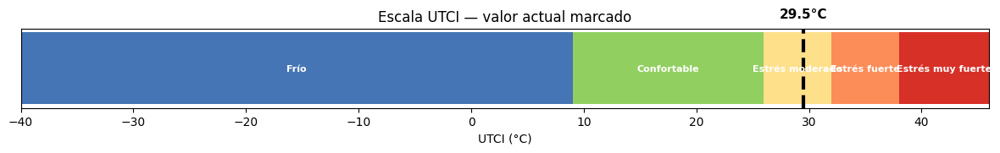

In [156]:
# ejecutar UTCI y agregar al snapshot
resultado_utci = calcular_y_clasificar_utci(
    sensor_data, snapshot_record['shade_parque_pct']
)
snapshot_record['utci_valor']     = resultado_utci['utci_valor']
snapshot_record['utci_categoria'] = resultado_utci['utci_categoria']
snapshot_record['tr_estimada']    = resultado_utci['tr_estimada']

print('=== UTCI ===')
print(f'  tdb={sensor_data["tdb"]}°C  tr={resultado_utci["tr_estimada"]}°C  '
      f'v={sensor_data["v"]}m/s  rh={sensor_data["rh"]}%  uv={sensor_data["uv"]}')
print(f'  UTCI: {resultado_utci["utci_valor"]}°C — {resultado_utci["utci_categoria"]}')

# barra escala UTCI
limites    = [-40, 9, 26, 32, 38, 46]
colores    = ['#4575b4', '#91cf60', '#fee08b', '#fc8d59', '#d73027']
categorias = ['Frío', 'Confortable', 'Estrés moderado', 'Estrés fuerte', 'Estrés muy fuerte']

fig, ax = plt.subplots(figsize=(12, 2))
for i in range(len(colores)):
    ax.barh(0, limites[i+1]-limites[i], left=limites[i],
            color=colores[i], height=0.5)
    ax.text((limites[i]+limites[i+1])/2, 0, categorias[i],
            ha='center', va='center', fontsize=8, fontweight='bold', color='white')
ax.axvline(x=resultado_utci['utci_valor'], color='black', linewidth=3, linestyle='--')
ax.text(resultado_utci['utci_valor'], 0.35,
        f'{resultado_utci["utci_valor"]}°C', ha='center', fontsize=11, fontweight='bold')
ax.set_xlim(-40, 46)
ax.set_xlabel('UTCI (°C)')
ax.set_yticks([])
ax.set_title('Escala UTCI — valor actual marcado', fontsize=12)
plt.tight_layout()
plt.show()

#### FASE 5: amononar datos

P1: calcular_aglomeración   
-recibe n_personas y de una constante de área del canil (DEFINIR UN APROX!!) densidad=n_personas/area_parque_m2, aglomeración= true si densidad>0.35 p/m2   
-retorna {densidad: float, aglomeración:bool} y agrega ambos campos al snapshot_record  

P2: ejecutar y resumen final snapshot   
-llama a calcular_alglomeración y agrega resultados, imprime resumen del snapshot   
-visualización bboxes, máscara sombra, heatmap densidad, estados, utci y categoría  


In [157]:
# función calcular aglomeración
def calcular_aglomeracion(n_personas, area_m2=AREA_PARQUE_M2):
    """
    Calcula densidad de personas y detecta aglomeración.
    Umbral 0.35 p/m² basado en estándares de confort en espacios públicos — [INVENTADO] verificar.
    """
    densidad = round(n_personas / area_m2, 4)
    return {
        'densidad':     densidad,
        'aglomeracion': densidad > 0.35,  # [AJUSTABLE]
    }

=== RESUMEN FINAL SNAPSHOT ===
  timestamp:             2026-05-30T22:22:55.434426
  snapshot_valido:       True
  condicion_luz:         diurno
  n_personas:            4
  n_mascotas:            1
  densidad:              0.0013 p/m²
  aglomeracion:          False
  shade_utilization_pct: 20.0%
  UTCI:                  29.5°C — estres moderado

  MOBILIARIO:
    banca_1         ⬜ libre  (0 usuarios)
    banca_2         ⬜ libre  (0 usuarios)
    banca_3         ⬜ libre  (0 usuarios)
    banca_4         ✅ ocupado  (1 usuarios)
    banca_5         ✅ ocupado  (1 usuarios)


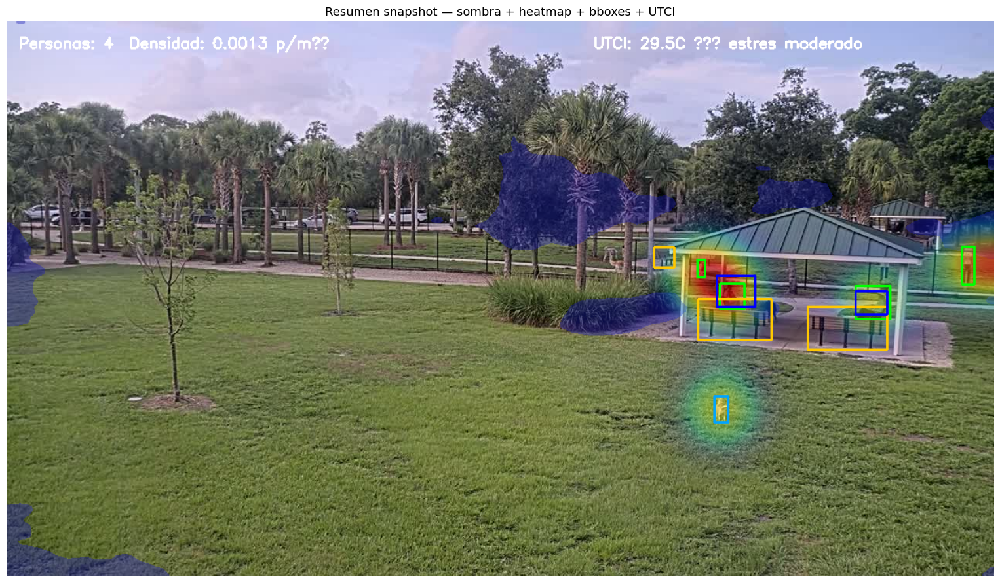

In [158]:
# ejecutar aglomeración y resumen final snapshot
resultado_aglomeracion          = calcular_aglomeracion(snapshot_record['n_personas'])
snapshot_record['densidad']     = resultado_aglomeracion['densidad']
snapshot_record['aglomeracion'] = resultado_aglomeracion['aglomeracion']

print('=== RESUMEN FINAL SNAPSHOT ===')
print(f'  timestamp:             {snapshot_record["timestamp"]}')
print(f'  snapshot_valido:       {snapshot_record["snapshot_valido"]}')
print(f'  condicion_luz:         {snapshot_record["condicion_luz"]}')
print(f'  n_personas:            {snapshot_record["n_personas"]}')
print(f'  n_mascotas:            {snapshot_record["n_mascotas"]}')
print(f'  densidad:              {snapshot_record["densidad"]} p/m²')
print(f'  aglomeracion:          {snapshot_record["aglomeracion"]}')
print(f'  shade_utilization_pct: {snapshot_record["shade_utilization_pct"]*100:.1f}%')
print(f'  UTCI:                  {snapshot_record["utci_valor"]}°C — {snapshot_record["utci_categoria"]}')
print(f'\n  MOBILIARIO:')
for nombre, e in snapshot_record['uso_mobiliario'].items():
    print(f'    {nombre:<15} {"✅ ocupado" if e["ocupado"] else "⬜ libre"}  ({e["n_usuarios"]} usuarios)')

# visualización final — sombra + heatmap + bboxes + texto
img_rgb      = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB).astype(np.float32)
mascara_3d   = mascara_sombra[:, :, np.newaxis]
img_base     = img_rgb * (1 - mascara_3d * 0.4) + \
               np.array([30, 30, 180], dtype=np.float32) * (mascara_3d * 0.4)  # [AJUSTABLE] opacidad sombra

calor_mask   = canvas_heatmap[:, :, np.newaxis]
img_final    = img_base * (1 - calor_mask * 0.6) + \
               plt.cm.jet(canvas_heatmap)[:,:,:3] * 255 * (calor_mask * 0.6)  # [AJUSTABLE] opacidad heatmap
img_final    = np.clip(img_final, 0, 255).astype(np.uint8)

for p in detecciones['personas']:
    x1,y1,x2,y2 = p['bbox']
    cv2.rectangle(img_final, (x1,y1), (x2,y2), COLOR_PERSONA, 2)
for m in detecciones['mascotas']:
    x1,y1,x2,y2 = m['bbox']
    cv2.rectangle(img_final, (x1,y1), (x2,y2), COLOR_MASCOTA, 2)
for nombre, (x1,y1,x2,y2) in MOBILIARIO_BBOXES.items():
    color = COLOR_MOBILIARIO_OCUPADO if snapshot_record['uso_mobiliario'][nombre]['ocupado'] \
            else COLOR_MOBILIARIO_LIBRE
    cv2.rectangle(img_final, (x1,y1), (x2,y2), color, 2)

cv2.putText(img_final,
            f"UTCI: {snapshot_record['utci_valor']}C — {snapshot_record['utci_categoria']}",
            (ancho-520, 35), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255,255,255), 2)
cv2.putText(img_final,
            f"Personas: {snapshot_record['n_personas']}  Densidad: {snapshot_record['densidad']} p/m²",
            (15, 35), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255,255,255), 2)

plt.figure(figsize=(16, 9))
plt.imshow(img_final)
plt.title('Resumen snapshot — sombra + heatmap + bboxes + UTCI', fontsize=13)
plt.axis('off')
plt.tight_layout()
plt.show()

#### fase 5.5: guardar data en bd

P1: setup bd    
-por ahora csv local, luego postgreSQL/RDS  
-definir headers: todas las columnas de snapshot_record, listas como centros_personas y centros_mascotas serializadas como json string      
-init_csv(path) si el archivo no existe se crea con headers, si ya existe no sobreescribe, solo append

P2: guardar_snapshot    
-guarda los datos al csv     
-ver timestamp

P3: ejecuta y confirma  
-llama al init y guardar    
-ver el n de snapshots del csv y su rango de fechas 

In [159]:
# setup BD — CSV local
# [CAMBIAR A FUTURO] reemplazar por PostgreSQL/RDS cuando el servidor esté levantado

RUTA_CSV = 'snapshots.csv'  # [CAMBIAR A FUTURO] apuntar a RDS

HEADERS = [
    'timestamp', 'tdb', 'rh', 'v', 'uv', 'lux',
    'condicion_luz', 'hora_operacional', 'shade_confiable', 'snapshot_valido',
    'n_personas', 'n_mascotas',
    'centros_personas', 'centros_mascotas',
    'shade_utilization_pct', 'shade_parque_pct',
    'uso_mobiliario',
    'utci_valor', 'utci_categoria', 'tr_estimada',
    'densidad', 'aglomeracion',
]

def init_csv(ruta, headers):
    """Crea el CSV con headers si no existe. Si ya existe solo hace append."""
    if not os.path.exists(ruta):
        with open(ruta, 'w', newline='', encoding='utf-8') as f:
            csv.DictWriter(f, fieldnames=headers).writeheader()
        print(f'✅ CSV creado: {ruta}')
    else:
        print(f'✅ CSV ya existe: {ruta}')

def guardar_snapshot(snapshot_record, ruta, headers):
    """Agrega una fila al CSV. Serializa listas y dicts como JSON string."""
    fila = {
        campo: json.dumps(snapshot_record.get(campo), ensure_ascii=False)
               if isinstance(snapshot_record.get(campo), (list, dict))
               else snapshot_record.get(campo)
        for campo in headers
    }
    with open(ruta, 'a', newline='', encoding='utf-8') as f:
        csv.DictWriter(f, fieldnames=headers).writerow(fila)
    print(f'✅ Snapshot guardado — {snapshot_record["timestamp"]}')

print('✅ Funciones CSV definidas')

✅ Funciones CSV definidas


In [160]:
# ejecutar guardar snapshot
init_csv(RUTA_CSV, HEADERS)
guardar_snapshot(snapshot_record, RUTA_CSV, HEADERS)

df_csv = pd.read_csv(RUTA_CSV)
print(f'\n  Snapshots en CSV: {len(df_csv)}')
if len(df_csv) > 0:
    print(f'  Primer ts: {df_csv["timestamp"].iloc[0]}')
    print(f'  Último ts: {df_csv["timestamp"].iloc[-1]}')

✅ CSV ya existe: snapshots.csv
✅ Snapshot guardado — 2026-05-30T22:22:55.434426

  Snapshots en CSV: 1263
  Primer ts: 2026-05-11T04:13:13.590800
  Último ts: 2026-05-30T22:22:55.434426


#### FASE 6: procesar data batch

P1: cargar de bd    
-luego reemplazar con query a postgreSQL    

P2: ocupación en el tiempo      
-n_personas_promedio de los snapshots de esa ventana    
  si n_personas_promedio > 0 durante X snapshots consecutivos   
  -> ocupación sostenida de X * intervalo_minutos   

P3: activity classification         
-para cada par de snapshots consecutivos:       
compara centros_personas y mascotas entre t y t-1   
  busca el centroide más cercano entre ambos snapshots      
  si se movió > umbral_px -> circulando     
  si está estable -> reposo     
-calcula % circulando vs reposo 
-retorna dict con distribuciones por categoría  

P4: uso mobiliario histórico        
-para cada mueble en mobiliario_bboxes:     
  cuenta snapshots donde ocupado=True       
  en las últimas X horas del df_historico       
  tasa_uso = n_snapshots_ocupado / n_snapshots_total        
  clasifica:        
    tasa = 0   : sin uso    
    tasa < 0.3 : uso normal         
    tasa >= 0.3: alta demanda   
-retorna dict {nombre_mueble: {tasa_uso, demanda}}  

P5: shade utilization histórico         
-agrupa df_historico por hora del día   
-calcula shade_utilization_pct promedio por hora    
-visualización: gráfico de línea        
  eje x = hora (8am a 8pm)  
  eje y = % personas en sombra    

P6: correlaciones           
-calcula correlación de Pearson entre pares de métricas, requiere muchos datos acumulados

P7: guardar resultados batch        
-construye el batch_record, los guarda en un csv e imprime confirmación con timestamp y métrica caluladas

### celda p0 para generar datos sinteticos

In [161]:
# procesar primeros 500 frames de frames_cinquez_20260530 y guardar en CSV
# [AJUSTABLE] cambiar carpeta o n_frames según necesidad
CARPETA_BATCH = 'frames_cinquez_20260530/'
N_FRAMES      = 100  # [AJUSTABLE]

frames_batch = sorted(glob.glob(f'{CARPETA_BATCH}*.jpg'))[:N_FRAMES]
print(f'Procesando {len(frames_batch)} frames...')

init_csv(RUTA_CSV, HEADERS)

for i, ruta_frame in enumerate(frames_batch):
    # extraer timestamp del nombre del archivo: 20260530_131329.jpg
    nombre = os.path.basename(ruta_frame).replace('.jpg', '')
    try:
        ts = datetime.datetime.strptime(nombre, '%Y%m%d_%H%M%S').isoformat()
    except ValueError:
        ts = datetime.datetime.now().isoformat()

    img = cargar_imagen_local(ruta_frame)

    # YOLO
    det = correr_yolo(img, modelo_yolo)

    # BDRAR
    hsv      = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    sat      = round(float(hsv[:,:,1].mean()), 2)
    brillo   = round(float(hsv[:,:,2].mean()), 2)
    noche_f  = es_de_noche(img)
    nublado_f= es_nublado(img)

    if noche_f or nublado_f:
        masc = np.zeros((ALTO, ANCHO), dtype=np.uint8)
        shade_ut = 0.0
    else:
        masc = detectar_sombra(img, modelo_bdrar, sat)
        for d in det['personas'] + det['mascotas']:
            d['en_sombra'], d['pct_sombra'] = persona_en_sombra(d['bbox'], masc)
        todos    = det['personas'] + det['mascotas']
        n_s      = sum(1 for d in todos if d['en_sombra'])
        shade_ut = round(n_s / len(todos), 3) if todos else 0.0

    # mobiliario
    uso_mob = inferir_uso_snapshot(det, MOBILIARIO_BBOXES)

    # sensores inventados
    # [INVENTADO] valores aleatorios representativos de verano en Maipú
    sd = {
        'timestamp': ts,
        'tdb': round(random.uniform(18.0, 36.0), 1),
        'rh':  round(random.uniform(25.0, 80.0), 1),
        'v':   round(random.uniform(0.0,  5.0),  1),
        'uv':  round(random.uniform(0.0, 11.0),  1),
        'lux': random.randint(500, 80000),
    }

    # construir snapshot
    snap = construir_snapshot_record(det, masc, shade_ut, uso_mob, sd)

    # UTCI
    res_utci = calcular_y_clasificar_utci(sd, snap['shade_parque_pct'])
    snap['utci_valor']     = res_utci['utci_valor']
    snap['utci_categoria'] = res_utci['utci_categoria']
    snap['tr_estimada']    = res_utci['tr_estimada']

    # aglomeración
    res_agl = calcular_aglomeracion(snap['n_personas'])
    snap['densidad']     = res_agl['densidad']
    snap['aglomeracion'] = res_agl['aglomeracion']

    guardar_snapshot(snap, RUTA_CSV, HEADERS)

    if (i+1) % 50 == 0:
        print(f'  [{i+1}/{len(frames_batch)}] procesados')

print(f'\n✅ {len(frames_batch)} frames procesados y guardados en {RUTA_CSV}')

Procesando 100 frames...
✅ CSV ya existe: snapshots.csv
✅ Snapshot guardado — 2026-05-30T13:13:29
✅ Snapshot guardado — 2026-05-30T13:13:33
✅ Snapshot guardado — 2026-05-30T13:13:34
✅ Snapshot guardado — 2026-05-30T13:13:35
✅ Snapshot guardado — 2026-05-30T13:13:36
✅ Snapshot guardado — 2026-05-30T13:13:38
✅ Snapshot guardado — 2026-05-30T13:13:39
✅ Snapshot guardado — 2026-05-30T13:13:40
✅ Snapshot guardado — 2026-05-30T13:13:41
✅ Snapshot guardado — 2026-05-30T13:13:42
✅ Snapshot guardado — 2026-05-30T13:13:43
✅ Snapshot guardado — 2026-05-30T13:13:44
✅ Snapshot guardado — 2026-05-30T13:13:45
✅ Snapshot guardado — 2026-05-30T13:13:46
✅ Snapshot guardado — 2026-05-30T13:13:48
✅ Snapshot guardado — 2026-05-30T13:13:49
✅ Snapshot guardado — 2026-05-30T13:13:50
✅ Snapshot guardado — 2026-05-30T13:13:51
✅ Snapshot guardado — 2026-05-30T13:13:53
✅ Snapshot guardado — 2026-05-30T13:13:54
✅ Snapshot guardado — 2026-05-30T13:13:55
✅ Snapshot guardado — 2026-05-30T13:13:56
✅ Snapshot guardado 

In [174]:
# cargar histórico desde CSV
# [CAMBIAR A FUTURO] reemplazar por query a PostgreSQL
def cargar_historico(ruta, n_ultimos=None, horas=None):
    """
    Carga snapshots desde CSV, deserializa JSON, filtra válidos.
    En producción: reemplazar por query a PostgreSQL.
    """
    df = pd.read_csv(ruta)
    for col in ['centros_personas', 'centros_mascotas', 'uso_mobiliario']:
        df[col] = df[col].apply(lambda x: json.loads(x) if pd.notna(x) else [])
    df['timestamp'] = pd.to_datetime(df['timestamp'], format='mixed')
    df = df.sort_values('timestamp').reset_index(drop=True)

    if horas is not None:
        corte = df['timestamp'].max() - pd.Timedelta(hours=horas)
        df    = df[df['timestamp'] >= corte].reset_index(drop=True)
    if n_ultimos is not None:
        df = df.tail(n_ultimos).reset_index(drop=True)

    print(f'✅ {len(df)} snapshots válidos cargados')
    print(f'   Rango: {df["timestamp"].min()} → {df["timestamp"].max()}')
    return df

df_historico = cargar_historico(RUTA_CSV)#

✅ 1459 snapshots válidos cargados
   Rango: 2026-05-05 09:55:00 → 2026-05-30 22:30:46.781626


In [163]:
# ocupación sostenida
INTERVALO_MIN = 5  # [AJUSTABLE] minutos entre snapshots

def calcular_ocupacion_sostenida(df, intervalo_min=INTERVALO_MIN):
    """
    Estima ocupación sostenida contando ventanas consecutivas con personas.
    Más honesto que dwell time porque no trackea individuos.
    """
    con_personas     = df['n_personas'] > 0
    max_consec = consec = 0
    for tiene in con_personas:
        consec = consec + 1 if tiene else 0
        max_consec = max(max_consec, consec)

    resultado = {
        'n_snapshots_con_personas': int(con_personas.sum()),
        'n_snapshots_total':        len(df),
        'max_consecutivos':         max_consec,
        'ocupacion_sostenida_min':  max_consec * intervalo_min,
    }
    print(f'Snapshots con personas: {resultado["n_snapshots_con_personas"]}/{resultado["n_snapshots_total"]}')
    print(f'Ocupación sostenida:    {resultado["ocupacion_sostenida_min"]} min')
    return resultado

ocupacion = calcular_ocupacion_sostenida(df_historico)

Snapshots con personas: 629/1408
Ocupación sostenida:    465 min


In [164]:
# activity classification
UMBRAL_MOVIMIENTO_PX = 50  # [AJUSTABLE] píxeles — calibrar con escala real del parque

def calcular_activity_classification(df):
    """
    Compara centros entre snapshots consecutivos.
    Movimiento > umbral → circulando, estable → reposo.
    """
    estados_p, estados_m = [], []

    for i in range(1, len(df)):
        for centros_ant, centros_act, estados in [
            (df.loc[i-1,'centros_personas'], df.loc[i,'centros_personas'], estados_p),
            (df.loc[i-1,'centros_mascotas'], df.loc[i,'centros_mascotas'], estados_m),
        ]:
            if centros_ant and centros_act:
                for d in cdist(centros_ant, centros_act).min(axis=1):
                    estados.append('circulando' if d > UMBRAL_MOVIMIENTO_PX else 'reposo')

    def distribucion(estados):
        if not estados: return {'circulando': 0.0, 'reposo': 0.0}
        total = len(estados)
        return {e: round(estados.count(e)/total, 3) for e in set(estados)}

    resultado = {
        'personas': distribucion(estados_p),
        'mascotas': distribucion(estados_m),
    }
    print(f'Personas: {resultado["personas"]}')
    print(f'Mascotas: {resultado["mascotas"]}')
    return resultado

activity = calcular_activity_classification(df_historico)

Personas: {'reposo': 0.198, 'circulando': 0.802}
Mascotas: {'reposo': 0.027, 'circulando': 0.973}


In [165]:
# uso mobiliario histórico
def calcular_uso_mobiliario_batch(df, mobiliario_bboxes):
    """
    Tasa de uso y demanda por mueble sobre el histórico.
    """
    n_total   = len(df)
    resultado = {}
    for nombre in mobiliario_bboxes:
        n_ocupado = sum(
            1 for uso in df['uso_mobiliario']
            if isinstance(uso, dict) and nombre in uso
            and uso[nombre].get('ocupado', False)
        )
        tasa_uso = round(n_ocupado / n_total, 3) if n_total > 0 else 0.0
        resultado[nombre] = {
            'tasa_uso': tasa_uso,
            'demanda':  'sin uso' if tasa_uso == 0
                        else 'alta demanda' if tasa_uso >= 0.3  # [AJUSTABLE]
                        else 'uso normal',
        }
    for nombre, d in resultado.items():
        print(f'  {nombre:<15} tasa={d["tasa_uso"]}  {d["demanda"]}')
    return resultado

uso_batch = calcular_uso_mobiliario_batch(df_historico, MOBILIARIO_BBOXES)

  banca_1         tasa=0.105  uso normal
  banca_2         tasa=0.021  uso normal
  banca_3         tasa=0.016  uso normal
  banca_4         tasa=0.018  uso normal
  banca_5         tasa=0.019  uso normal


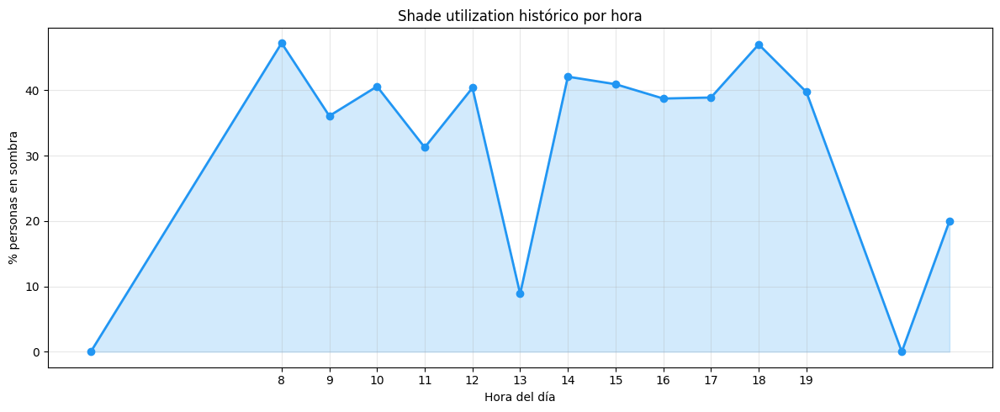

In [166]:
# shade utilization histórico
def calcular_shade_historico(df):
    """Promedio de shade_utilization_pct por hora del día."""
    df_h = df.copy()
    df_h['hora'] = df_h['timestamp'].dt.hour
    shade_x_hora = df_h.groupby('hora')['shade_utilization_pct'].mean().reset_index()

    plt.figure(figsize=(12, 5))
    plt.plot(shade_x_hora['hora'], shade_x_hora['shade_utilization_pct']*100,
             marker='o', color='#2196F3', linewidth=2)
    plt.fill_between(shade_x_hora['hora'],
                     shade_x_hora['shade_utilization_pct']*100,
                     alpha=0.2, color='#2196F3')
    plt.xlabel('Hora del día')
    plt.ylabel('% personas en sombra')
    plt.title('Shade utilization histórico por hora')
    plt.xticks(range(8, 20))
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    return shade_x_hora

shade_historico = calcular_shade_historico(df_historico)

In [167]:
# correlaciones
def calcular_correlaciones(df):
    """
    Correlación de Pearson entre pares de métricas.
    Requiere ≥ 7 días de datos para ser estadísticamente significativo.
    """
    pares = [
        ('uv',        'shade_utilization_pct', 'UV vs Shade utilization'),
        ('utci_valor','n_personas',             'UTCI vs N personas'),
        ('v',         'n_personas',             'Viento vs N personas'),
        ('lux',       'shade_utilization_pct',  'Lux vs Shade utilization'),
    ]
    resultado = {}
    for col_a, col_b, etiqueta in pares:
        r     = round(df[col_a].corr(df[col_b]), 3)
        nivel = 'alta' if abs(r) > 0.7 else 'media' if abs(r) > 0.4 else 'baja'
        resultado[etiqueta] = {'r': r, 'nivel': nivel}
        print(f'  {etiqueta:<35} r={r:+.3f}  ({nivel})')
    return resultado

correlaciones = calcular_correlaciones(df_historico)

  UV vs Shade utilization             r=+0.061  (baja)
  UTCI vs N personas                  r=+0.184  (baja)
  Viento vs N personas                r=+0.019  (baja)
  Lux vs Shade utilization            r=-0.036  (baja)


In [168]:
# guardar batch record
# [CAMBIAR A FUTURO] reemplazar CSV por tabla batch en PostgreSQL
RUTA_CSV_BATCH = 'batch.csv'
HEADERS_BATCH  = [
    'timestamp_batch', 'n_snapshots_procesados', 'ocupacion_sostenida_min',
    'n_snapshots_con_personas', 'activity_personas', 'activity_mascotas',
    'uso_mobiliario_batch', 'correlaciones',
]

batch_record = {
    'timestamp_batch':          datetime.datetime.now().isoformat(),
    'n_snapshots_procesados':   len(df_historico),
    'ocupacion_sostenida_min':  ocupacion['ocupacion_sostenida_min'],
    'n_snapshots_con_personas': ocupacion['n_snapshots_con_personas'],
    'activity_personas':        activity['personas'],
    'activity_mascotas':        activity['mascotas'],
    'uso_mobiliario_batch':     uso_batch,
    'correlaciones':            correlaciones,
}

init_csv(RUTA_CSV_BATCH, HEADERS_BATCH)
fila_batch = {
    campo: json.dumps(valor, ensure_ascii=False)
           if isinstance(valor, (dict, list)) else valor
    for campo, valor in batch_record.items()
}
with open(RUTA_CSV_BATCH, 'a', newline='', encoding='utf-8') as f:
    csv.DictWriter(f, fieldnames=HEADERS_BATCH).writerow(fila_batch)

print(f'✅ Batch guardado — {batch_record["timestamp_batch"]}')
print(f'   Snapshots procesados: {batch_record["n_snapshots_procesados"]}')

✅ CSV ya existe: batch.csv
✅ Batch guardado — 2026-05-30T22:27:00.390653
   Snapshots procesados: 1408


#### FASE 7: kmeans

P1: preparar features (agrupa resultados de fase 6 x zona)

P2: determinar n_cluster con metodo del codo

P3: correr kmeans y asignar etiquetas

P4: visualizar mapa de islas de calor

P5: guadar resultado kmeans en bd

In [169]:
# preparar features por zona para KMeans
def preparar_features_zonas(df_historico, mobiliario_bboxes):
    """
    Calcula promedios históricos por zona semántica.
    Zonas = bboxes manuales del mobiliario + zona general del parque.
    """
    zonas = [{
        'zona':            'parque_general',
        'utci_prom':       round(df_historico['utci_valor'].mean(), 2),
        'shade_pct_prom':  round(df_historico['shade_parque_pct'].mean(), 3),
        'n_personas_prom': round(df_historico['n_personas'].mean(), 2),
        'ocupacion_prom':  round((df_historico['n_personas'] > 0).mean(), 3),
    }]

    for nombre in mobiliario_bboxes:
        ocupados   = df_historico['uso_mobiliario'].apply(
            lambda uso: uso.get(nombre, {}).get('ocupado', False)
            if isinstance(uso, dict) else False
        )
        n_usuarios = df_historico['uso_mobiliario'].apply(
            lambda uso: uso.get(nombre, {}).get('n_usuarios', 0)
            if isinstance(uso, dict) else 0
        )
        zonas.append({
            'zona':            nombre,
            'utci_prom':       round(df_historico['utci_valor'].mean(), 2),
            'shade_pct_prom':  round(df_historico['shade_parque_pct'].mean(), 3),
            'n_personas_prom': round(n_usuarios.mean(), 2),
            'ocupacion_prom':  round(ocupados.mean(), 3),
        })

    df_zonas = pd.DataFrame(zonas)
    print(df_zonas.to_string(index=False))
    return df_zonas

df_zonas = preparar_features_zonas(df_historico, MOBILIARIO_BBOXES)

          zona  utci_prom  shade_pct_prom  n_personas_prom  ocupacion_prom
parque_general      29.12           0.118             2.52           0.447
       banca_1      29.12           0.118             0.35           0.105
       banca_2      29.12           0.118             0.05           0.021
       banca_3      29.12           0.118             0.06           0.016
       banca_4      29.12           0.118             0.06           0.018
       banca_5      29.12           0.118             0.05           0.019


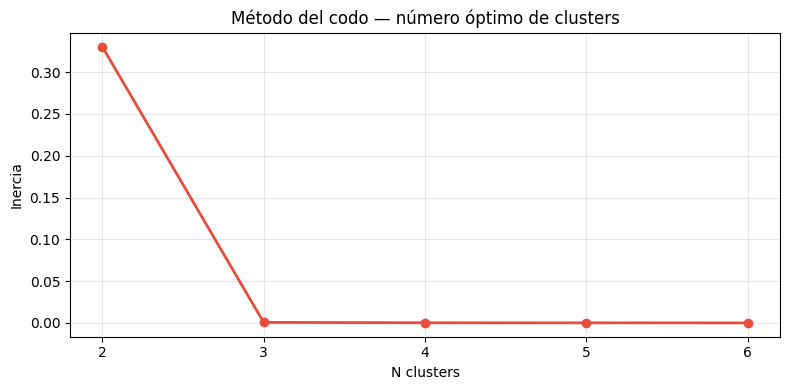

  n=2: 0.3305
  n=3: 0.0007
  n=4: 0.0002
  n=5: 0.0001
  n=6: 0.0000


In [170]:
# método del codo para determinar n_clusters
def calcular_codo(df_zonas):
    """Determina el número óptimo de clusters. Con pocas zonas suele ser 2 o 3."""
    features  = ['utci_prom', 'shade_pct_prom', 'n_personas_prom', 'ocupacion_prom']
    X         = df_zonas[features].values
    escalador = StandardScaler()
    X_scaled  = escalador.fit_transform(X)

    n_max    = min(len(df_zonas), 6)
    rango_n  = range(2, n_max+1)
    inercias = [KMeans(n_clusters=n, random_state=42, n_init=10).fit(X_scaled).inertia_
                for n in rango_n]

    plt.figure(figsize=(8, 4))
    plt.plot(list(rango_n), inercias, marker='o', color='#e74c3c', linewidth=2)
    plt.xlabel('N clusters')
    plt.ylabel('Inercia')
    plt.title('Método del codo — número óptimo de clusters')
    plt.xticks(list(rango_n))
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    for n, inercia in zip(rango_n, inercias):
        print(f'  n={n}: {inercia:.4f}')

    return X_scaled, escalador

X_scaled, escalador = calcular_codo(df_zonas)

In [171]:
# correr KMeans
N_CLUSTERS = 2  # [AJUSTABLE] según método del codo

# [INVENTADO] etiquetas semánticas — calibrar con criterio experto
ETIQUETAS_CONFORT = {
    0: 'confortable',
    1: 'estrés leve',
    2: 'estrés moderado',
    3: 'alto estrés',
}

def correr_kmeans(df_zonas, X_scaled, n_clusters=N_CLUSTERS):
    """
    Corre KMeans y asigna etiquetas ordenadas por utci_prom ascendente.
    Cluster 0 = más fresco, último = más caliente.
    """
    km        = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    df_result = df_zonas.copy()
    df_result['cluster_raw'] = km.fit_predict(X_scaled)

    mapa_clusters = {
        viejo: nuevo for nuevo, viejo in enumerate(
            df_result.groupby('cluster_raw')['utci_prom'].mean().sort_values().index
        )
    }
    df_result['cluster']  = df_result['cluster_raw'].map(mapa_clusters)
    df_result['etiqueta'] = df_result['cluster'].map(ETIQUETAS_CONFORT)

    cols = ['zona', 'utci_prom', 'shade_pct_prom', 'n_personas_prom', 'cluster', 'etiqueta']
    print(df_result[cols].to_string(index=False))
    return df_result, km

df_kmeans, modelo_kmeans = correr_kmeans(df_zonas, X_scaled, N_CLUSTERS)

          zona  utci_prom  shade_pct_prom  n_personas_prom  cluster    etiqueta
parque_general      29.12           0.118             2.52        1 estrés leve
       banca_1      29.12           0.118             0.35        0 confortable
       banca_2      29.12           0.118             0.05        0 confortable
       banca_3      29.12           0.118             0.06        0 confortable
       banca_4      29.12           0.118             0.06        0 confortable
       banca_5      29.12           0.118             0.05        0 confortable


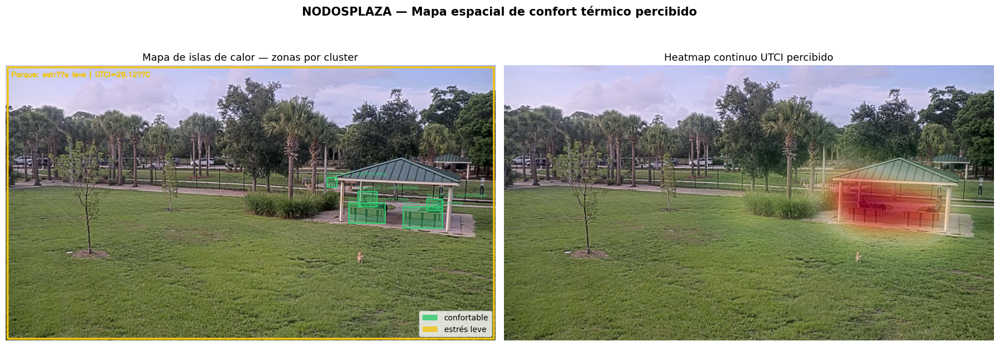

In [172]:
# visualizar mapa de islas de calor
COLORES_CONFORT = {
    'confortable':     '#2ecc71',
    'estrés leve':     '#f1c40f',
    'estrés moderado': '#e67e22',
    'alto estrés':     '#e74c3c',
}

def visualizar_mapa_confort(img_bgr, df_kmeans, mobiliario_bboxes):
    """Mapa de islas de calor con bboxes coloreadas por cluster y heatmap continuo de UTCI."""
    alto, ancho = img_bgr.shape[:2]
    img_mapa    = img_bgr.copy()

    for _, fila in df_kmeans.iterrows():
        zona      = fila['zona']
        color_hex = COLORES_CONFORT.get(fila['etiqueta'], '#95a5a6')
        r, g, b   = int(color_hex[1:3],16), int(color_hex[3:5],16), int(color_hex[5:7],16)
        color_bgr = (b, g, r)

        if zona == 'parque_general':
            cv2.rectangle(img_mapa, (5,5), (ancho-5, alto-5), color_bgr, 4)
            cv2.putText(img_mapa,
                        f"Parque: {fila['etiqueta']} | UTCI={fila['utci_prom']}°C",
                        (15, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color_bgr, 2)
        elif zona in mobiliario_bboxes:
            x1, y1, x2, y2 = mobiliario_bboxes[zona]
            overlay = img_mapa.copy()
            cv2.rectangle(overlay, (x1,y1), (x2,y2), color_bgr, -1)
            cv2.addWeighted(overlay, 0.4, img_mapa, 0.6, 0, img_mapa)
            cv2.rectangle(img_mapa, (x1,y1), (x2,y2), color_bgr, 2)
            cv2.putText(img_mapa, f"{zona} | {fila['etiqueta']}",
                        (x1, y1-6), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color_bgr, 1)

    # heatmap continuo UTCI
    canvas_utci = np.zeros((alto, ancho), dtype=np.float32)
    for _, fila in df_kmeans.iterrows():
        zona = fila['zona']
        cx, cy = (ancho//2, alto//2) if zona not in mobiliario_bboxes else (
            (mobiliario_bboxes[zona][0]+mobiliario_bboxes[zona][2])//2,
            (mobiliario_bboxes[zona][1]+mobiliario_bboxes[zona][3])//2
        )
        if 0 <= cx < ancho and 0 <= cy < alto:
            canvas_utci[cy, cx] = fila['utci_prom']

    canvas_utci = gaussian_filter(canvas_utci, sigma=80)  # [AJUSTABLE] suavizado
    if canvas_utci.max() > 0:
        canvas_utci /= canvas_utci.max()

    img_rgb   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    mascara_h = canvas_utci[:,:,np.newaxis]
    img_heat  = np.clip(
        img_rgb * (1 - mascara_h * 0.7) +                   # [AJUSTABLE] opacidad
        plt.cm.RdYlGn_r(canvas_utci)[:,:,:3] * (mascara_h * 0.7),
        0, 1
    )

    fig, ejes = plt.subplots(1, 2, figsize=(18, 7))
    ejes[0].imshow(cv2.cvtColor(img_mapa, cv2.COLOR_BGR2RGB))
    ejes[0].set_title('Mapa de islas de calor — zonas por cluster', fontsize=13)
    ejes[0].axis('off')
    ejes[0].legend(handles=[
        patches.Patch(facecolor=color, label=etiqueta, alpha=0.8)
        for etiqueta, color in COLORES_CONFORT.items()
        if etiqueta in df_kmeans['etiqueta'].values
    ], loc='lower right', fontsize=10)

    ejes[1].imshow(img_heat)
    ejes[1].set_title('Heatmap continuo UTCI percibido', fontsize=13)
    ejes[1].axis('off')

    plt.suptitle('NODOSPLAZA — Mapa espacial de confort térmico percibido',
                 fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()

visualizar_mapa_confort(img_original, df_kmeans, MOBILIARIO_BBOXES)

In [173]:
# guardar resultado KMeans
# [CAMBIAR A FUTURO] reemplazar CSV por tabla kmeans en PostgreSQL
RUTA_CSV_KMEANS = 'kmeans.csv'
HEADERS_KMEANS  = ['timestamp_kmeans', 'n_clusters', 'n_snapshots_usados', 'zonas']

kmeans_record = {
    'timestamp_kmeans':   datetime.datetime.now().isoformat(),
    'n_clusters':         N_CLUSTERS,
    'n_snapshots_usados': len(df_historico),
    'zonas': df_kmeans[['zona','utci_prom','shade_pct_prom',
                         'n_personas_prom','cluster','etiqueta']].to_dict(orient='records'),
}

init_csv(RUTA_CSV_KMEANS, HEADERS_KMEANS)
fila_kmeans = {
    campo: json.dumps(valor, ensure_ascii=False)
           if isinstance(valor, (dict, list)) else valor
    for campo, valor in kmeans_record.items()
}
with open(RUTA_CSV_KMEANS, 'a', newline='', encoding='utf-8') as f:
    csv.DictWriter(f, fieldnames=HEADERS_KMEANS).writerow(fila_kmeans)

print(f'✅ KMeans guardado — {kmeans_record["timestamp_kmeans"]}')
for _, fila in df_kmeans.iterrows():
    print(f'   {fila["zona"]:<20} → {fila["etiqueta"]} (UTCI={fila["utci_prom"]}°C)')

✅ CSV ya existe: kmeans.csv
✅ KMeans guardado — 2026-05-30T22:27:05.213037
   parque_general       → estrés leve (UTCI=29.12°C)
   banca_1              → confortable (UTCI=29.12°C)
   banca_2              → confortable (UTCI=29.12°C)
   banca_3              → confortable (UTCI=29.12°C)
   banca_4              → confortable (UTCI=29.12°C)
   banca_5              → confortable (UTCI=29.12°C)
